The goal of this notebook is to get familiar with *sequencial* data-sets. This notebook is divided in three parts:

- We start by looking at time series (i.e. sequence of numbers or vectors) and present Auto-Regressive model to make (simple) predictions.
- Then we discuss n-gram models used for analyzing *text*.
- We finish by briefly discussing *vanilla* Recurrent Neural Networks (RNN).


# Auto-Regressive model
We suppose that the input is given as a sequence of scalars: $x_1,x_2,\dots,x_t$ with $x_t\in \mathbb{R}$. The goal is to predict the next value $x_{t+1}$, we denote our prediction $\hat{y}_t$.

<div>
<img src="figures/AR_time_series.png" width="800"/>
</div>


In a auto-regressive model, we suppose that $x_{t+1}$ is approximated by a linear combination of the $n$ previous values:

$$x_{t+1} \approx a_0\cdot x_t +  a_1\cdot x_{t-1} + \dots + a_{n-1}\cdot x_{t-(n-1)} + b.$$

With this assumption, our prediction $\hat{y}_t$ is a linear model with $n+1$ parameters: $θ=\{a_0,\dots,a_{n-1},b\}$. Let's give an example by generating 'synthetic data' (a sinusoid with some noise).

In [ ]:
import numpy as np
# generate "synthetic" data
N = 100
N_train = 80
t = np.arange(0,N)
x = np.sin(.3*t) + .05*np.random.randn(N)
# split
x_train,x_test = x[:N_train],x[N_train:]

We use the library *statsmodel* to estimate the parameters $θ$ (i.e. minimizing the mean-square error: $\sum_t |\hat{y}_t-x_{t+1}|$).

In [ ]:
from statsmodels.tsa.ar_model import AutoReg
# define the model
model_AR = AutoReg(x_train,lags=3)
# fit the model with a windows n=3
myModel = model_AR.fit()
b,a0,a1,a2 = myModel.params
print("-- parameters: ")
print("b,a0,a1,a2 = {:1.5f}, {:1.5f}, {:1.5f}, {:1.5f}".format(b,a0,a1,a2))
#dir(myModel)

-- parameters: 
b,a0,a1,a2 = 0.00011, 1.21217, 0.28155, -0.64851


The model can be used to make predictions:

  1. we initialize at the last points $x_{t-2}=x_{77}$, $x_{t-1}=x_{78}$ and $x_{t}=x_{79}$,
  
  2. make a prediction: $\hat{y}_t = a_0 x_t + a_1 x_{t-1} + a_2 x_{t-2} +b$
  
  3. re-initialize: $x_{t-2}=x_{t-1},\,x_{t-1}=x_t,\,x_t=\hat{y}_t$ and loop in step 1.



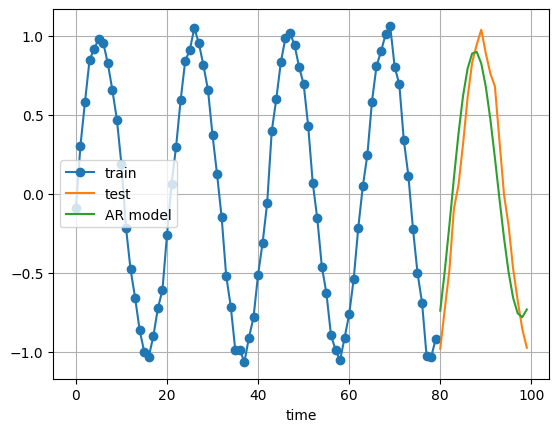

In [ ]:
import matplotlib.pyplot as plt
# prediction
y_prediction = np.zeros(N-N_train)
x_tm2,x_tm1,x_t = x_train[(N_train-3):N_train]
for k in range(N-N_train):
    # prediction t+1
    y = a0*x_t + a1*x_tm1 + a2*x_tm2 + b
    # save
    y_prediction[k] = y
    #x_tm2,x_tm1,x_t = x_tm1,x_t,y
    x_tm2 = x_tm1
    x_tm1 = x_t
    x_t = y
# plot
plt.figure(1);plt.clf()
plt.plot(range(N_train),x_train,'-o',label='train')
plt.plot(range(N_train,N),x_test,label='test')
plt.plot(range(N_train,N),y_prediction,label='AR model')
plt.xlabel('time')
plt.legend()
plt.grid()
plt.draw()

**Ex.** Change the data-set to make the model performs poorly.

# n-gram models

## Introduction

We would like to use a similar strategy as Auto-Regressive model to predict new words in a sentence. Let's give an example:

<center>the dog is  _?_ </center>

We are given three words $\omega_1="the"$, $\omega_2="dog"$, $\omega_3="is"$ and the goal is to predict the fourth word $\omega_4$. The major difference with Auto-Regressive model is that the input sentence is no longer a list of scalars (or vectors) thus we can add or multiply (i.e. $a_0*\omega_t+a_1*\omega_{t-1}$ has no meaning).

Instead of 'predicting' *one* word $\hat{y}_t$, we propose a model that can predict *any* words $\omega$, i.e. $\hat{Y}_t$ is now a random variable. We want the random variable $\hat{Y}_t$ to have a higher chance to a word $\omega$ that occurs frequently in our data-set. More precisely, we would like:

<center> $\mathbb{P}(\hat{Y}_t=\omega|\omega_1,\omega_{2},\dots, \omega_t) = \mathbb{P}(\omega_{t+1}=\omega|\omega_1,\omega_{2},\dots, \omega_t)$</center>

where $\mathbb{P}(A|B)$ means the probability of event $A$ knowing that $B$ happens.

In a 'n-gram' model, we assume that the probability that $\omega_{t+1}$ occurs only depends only on the $(n-1)$ previous words ($n$ is a fixed window size), i.e.

<center> $\mathbb{P}(\omega_{t+1}|\omega_1,\omega_{2},\dots, \omega_t) \approx \mathbb{P}(\omega_{t+1}|\omega_{t-(n-1)} ,\dots, \omega_{t-1},\omega_{t})$ </center>

To estimate this probability, we use the formula $\mathbb{P}(A|B)=\frac{\mathbb{P}(A\cap B)}{\mathbb{P}(B)}$:

<center> $\mathbb{P}(\omega|\omega_{t-1},\omega_t) = \frac{\#\{(\omega_{t-1},\omega_t,\omega)\}}{\#\{(\omega_{t-1},\omega_t)\}}$ </center>

where $\#\{...\}$ counts the number of occurences of a given tuples.


**Special case.** In a bigram model (n=1), to estimate the probability that the word 'the' is followed by 'dog' (i.e. $\mathbb{P}(\omega_{t+1}="dog"|\omega_t="the"$), we first count in the data-set (i.e. the long sequence $(\omega_1,\dots,\omega_T)$) how many occurences of $("the","dog")$ appears, then counts the number of occurences of the single word $("the")$. The probability that we are looking for is the ratio between the two numbers.

In [46]:
import nltk
nltk.download('brown')

[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Unzipping corpora/brown.zip.


True

In [47]:
import nltk.corpus

In [48]:
sentences = nltk.corpus.brown.sents()

In [49]:
len(sentences)

57340

In [50]:
sentences[0]

['The',
 'Fulton',
 'County',
 'Grand',
 'Jury',
 'said',
 'Friday',
 'an',
 'investigation',
 'of',
 "Atlanta's",
 'recent',
 'primary',
 'election',
 'produced',
 '``',
 'no',
 'evidence',
 "''",
 'that',
 'any',
 'irregularities',
 'took',
 'place',
 '.']

In [51]:
n_grams = {}

In [66]:
for sentence in sentences:
    words = [word for word in sentence if word.isalpha()]
    for ix in range(len(words)-1): # No word follows the last word so len() -1
        try:
            n_grams[words[ix]].append(words[ix+1])
        except KeyError as _:
            pass

In [67]:
n_grams

{'The': ['Fulton',
  'jury',
  'term',
  'jury',
  'grand',
  'City',
  'grand',
  'jurors',
  'jury',
  'jury',
  'jury',
  'jury',
  'couple',
  'petition',
  'petition',
  'Hartsfield',
  'present',
  'largest',
  'Republicans',
  'Georgia',
  'bond',
  'department',
  'Highway',
  'Constitution',
  'resolution',
  'new',
  'campaign',
  'former',
  'bill',
  'escheat',
  'bill',
  'TEA',
  'house',
  'senate',
  'third',
  'other',
  'West',
  'proposal',
  'bill',
  'defenders',
  'remainder',
  'board',
  'report',
  'report',
  'monthly',
  'volume',
  'disclosure',
  'statements',
  'President',
  'last',
  'cases',
  'case',
  'President',
  'aged',
  'social',
  'Kennedy',
  'payroll',
  'aged',
  'President',
  'plan',
  'President',
  'scholarship',
  'schools',
  'President',
  'President',
  'President',
  'President',
  'rule',
  'most',
  'nightmare',
  'general',
  'impression',
  'Secretary',
  'Secretary',
  'greatest',
  'annual',
  'Kennedy',
  'United',
  'United'

In [68]:
import random

In [69]:
def generate_sentence(nb=7):
    words = []
    next_word = random.choice(list(n_grams.keys()))
    words.append(next_word)
    while len(words)<nb:
        next_word = random.choice(n_grams[next_word])
        words.append(next_word)

    return " ".join(words)

In [71]:
generate_sentence()

'sera revealed that they ran through it'